In [1]:
import _init_paths
import tensorflow as tf

#import matplotlib
#matplotlib.use('Agg') # Must be before importing matplotlib.pyplot or pylab!
import matplotlib.pyplot as plt
%pylab inline

from fast_rcnn.config import cfg
from fast_rcnn.test import im_detect
from fast_rcnn.nms_wrapper import nms
from utils.timer import Timer
import numpy as np
import os, sys, cv2
import argparse
from networks.factory import get_network

CLASSES = ('__background__',
           'aeroplane', 'bicycle', 'bird', 'boat',
           'bottle', 'bus', 'car', 'cat', 'chair',
           'cow', 'diningtable', 'dog', 'horse',
           'motorbike', 'person', 'pottedplant',
           'sheep', 'sofa', 'train', 'tvmonitor')


Populating the interactive namespace from numpy and matplotlib


In [2]:

#CLASSES = ('__background__','person','bike','motorbike','car','bus')

def vis_detections(im, class_name, dets,ax, thresh=0.5):
    """Draw detected bounding boxes."""
    inds = np.where(dets[:, -1] >= thresh)[0]
    if len(inds) == 0:
        return

    for i in inds:
        bbox = dets[i, :4]
        score = dets[i, -1]

        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1], fill=False,
                          edgecolor='red', linewidth=3.5)
            )
        ax.text(bbox[0], bbox[1] - 2,
                '{:s} {:.3f}'.format(class_name, score),
                bbox=dict(facecolor='blue', alpha=0.5),
                fontsize=14, color='white')

    ax.set_title(('{} detections with '
                  'p({} | box) >= {:.1f}').format(class_name, class_name,
                                                  thresh),
                  fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.draw()


In [3]:

def demo(sess, net, image_name):
    """Detect object classes in an image using pre-computed object proposals."""

    # Load the demo image
    im_file = os.path.join(cfg.DATA_DIR, 'demo', image_name)
    #im_file = os.path.join('/home/corgi/Lab/label/pos_frame/ACCV/training/000001/',image_name)
    im = cv2.imread(im_file)

    # Detect all object classes and regress object bounds
    timer = Timer()
    timer.tic()
    scores, boxes = im_detect(sess, net, im)
    timer.toc()
    print ('Detection took {:.3f}s for '
           '{:d} object proposals').format(timer.total_time, boxes.shape[0])

    # Visualize detections for each class
    im = im[:, :, (2, 1, 0)]
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(im, aspect='equal')

    CONF_THRESH = 0.8
    NMS_THRESH = 0.3
    for cls_ind, cls in enumerate(CLASSES[1:]):
        cls_ind += 1 # because we skipped background
        cls_boxes = boxes[:, 4*cls_ind:4*(cls_ind + 1)]
        cls_scores = scores[:, cls_ind]
        dets = np.hstack((cls_boxes,
                          cls_scores[:, np.newaxis])).astype(np.float32)
        keep = nms(dets, NMS_THRESH)
        dets = dets[keep, :]
        vis_detections(im, cls, dets, ax, thresh=CONF_THRESH)


In [4]:
cfg.TEST.HAS_RPN = True  # Use RPN for proposals
gpu_id = 1
demo_net = "VGGnet_test"
model = "/home/ubuntu/dev/Faster-RCNN_TF/VGGnet_fast_rcnn_iter_70000.ckpt"

In [5]:
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True))

In [6]:
net = get_network(demo_net)

Tensor("Placeholder:0", shape=(?, ?, ?, 3), dtype=float32)
Tensor("conv5_3/conv5_3:0", shape=(?, ?, ?, 512), dtype=float32)
Tensor("rpn_conv/3x3/rpn_conv/3x3:0", shape=(?, ?, ?, 512), dtype=float32)
Tensor("rpn_cls_score/rpn_cls_score:0", shape=(?, ?, ?, 18), dtype=float32)
Tensor("rpn_cls_prob:0", shape=(?, ?, ?, ?), dtype=float32)
Tensor("rpn_cls_prob_reshape:0", shape=(?, ?, ?, 18), dtype=float32)
Tensor("rpn_bbox_pred/rpn_bbox_pred:0", shape=(?, ?, ?, 36), dtype=float32)
Tensor("Placeholder_1:0", shape=(?, 3), dtype=float32)
Tensor("conv5_3/conv5_3:0", shape=(?, ?, ?, 512), dtype=float32)
Tensor("rois:0", shape=(?, 5), dtype=float32)
[<tf.Tensor 'conv5_3/conv5_3:0' shape=(?, ?, ?, 512) dtype=float32>, <tf.Tensor 'rois:0' shape=(?, 5) dtype=float32>]
Tensor("fc7/fc7:0", shape=(?, 4096), dtype=float32)


In [7]:
saver = tf.train.Saver()

In [8]:
saver.restore(sess, model)

print('\n\nLoaded network {:s}'.format(model))



Loaded network /home/ubuntu/dev/Faster-RCNN_TF/VGGnet_fast_rcnn_iter_70000.ckpt


In [9]:
# Warmup on a dummy image
im = 128 * np.ones((300, 300, 3), dtype=np.uint8)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/000456.jpg
Detection took 0.078s for 300 object proposals
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/000542.jpg
Detection took 0.084s for 261 object proposals
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/001150.jpg
Detection took 0.071s for 232 object proposals
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/001763.jpg
Detection took 0.081s for 265 object proposals
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/004545.jpg
Detection took 0.075s for 300 object proposals
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Demo for data/demo/pedestrian_cars.jpg
Detection took 0.973s for 300 object proposals


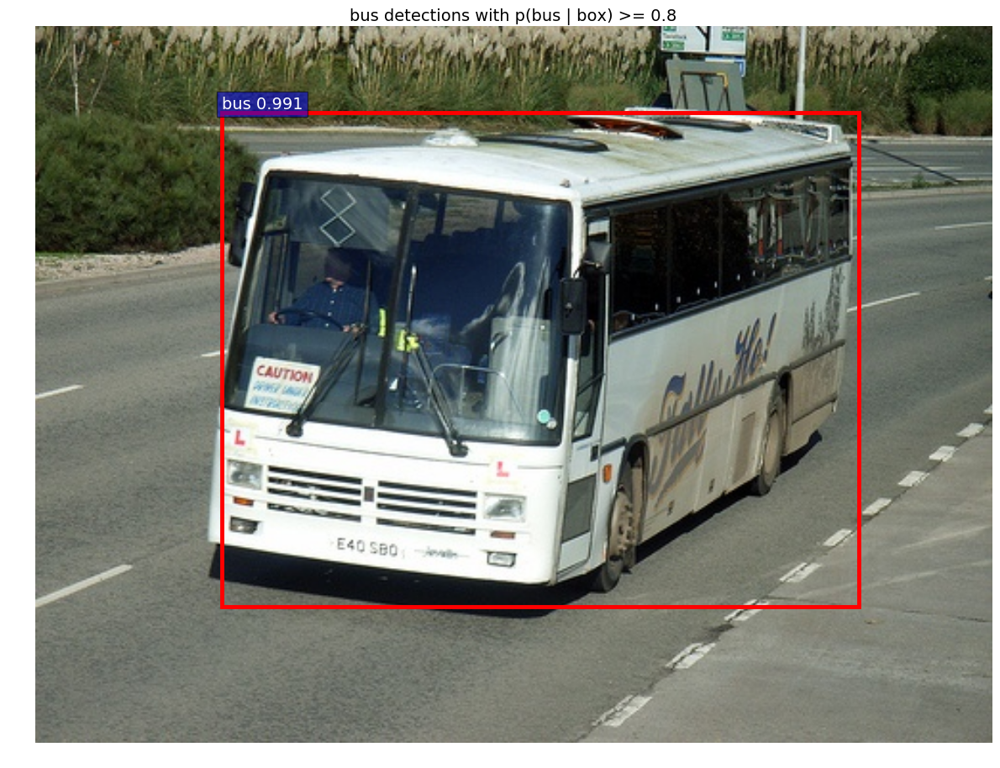

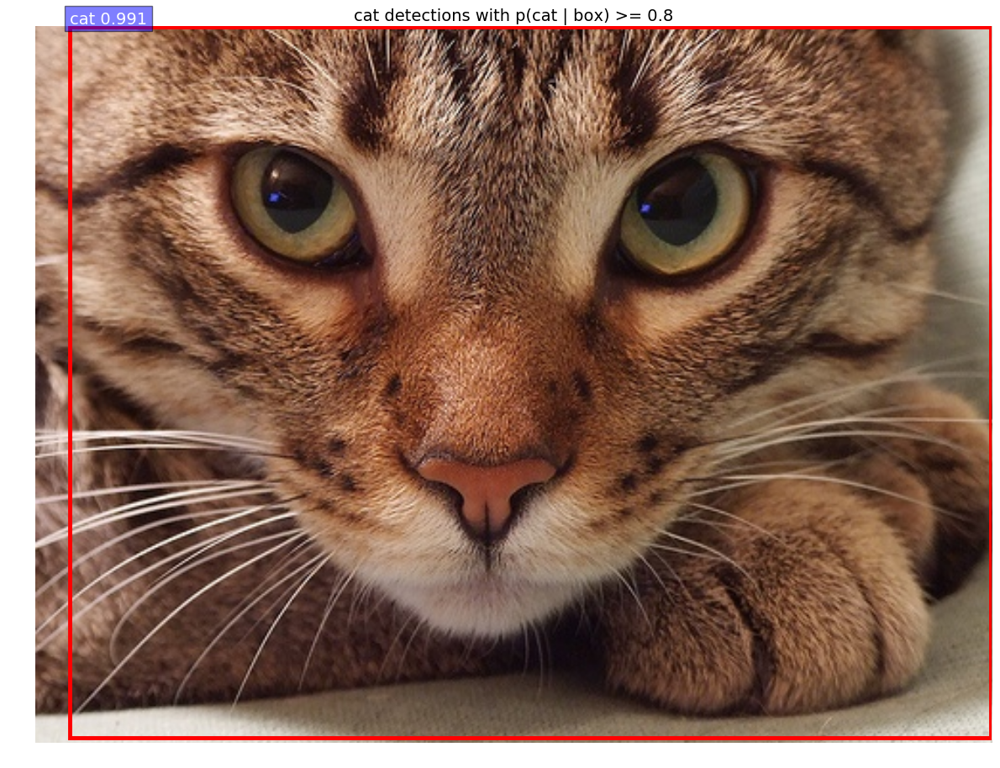

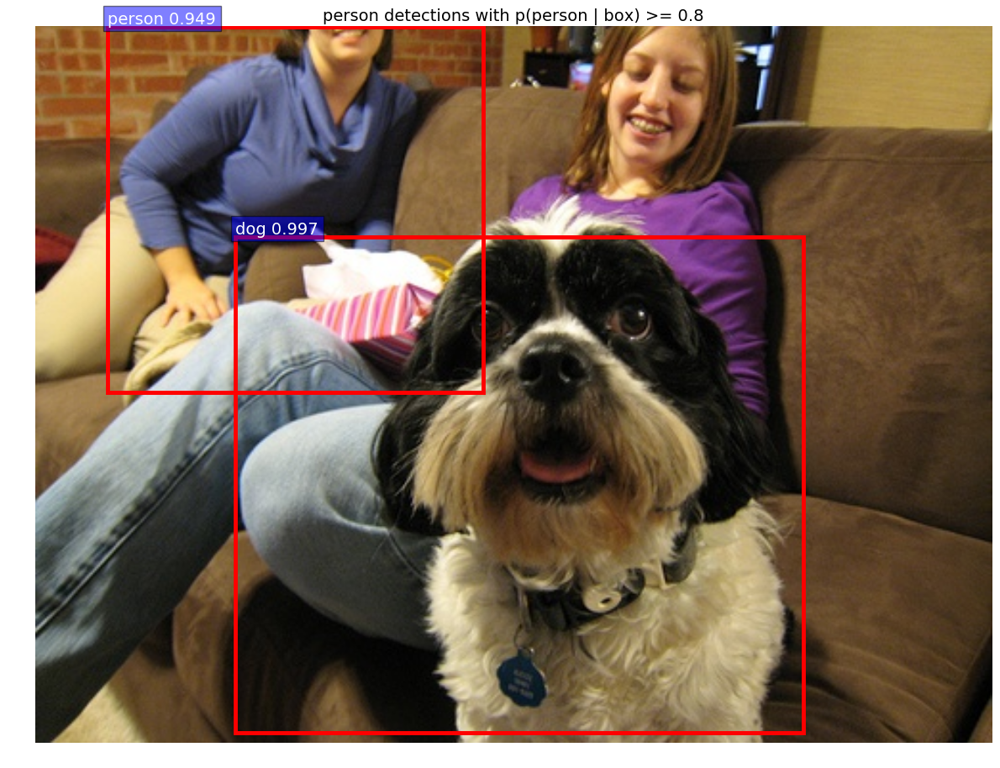

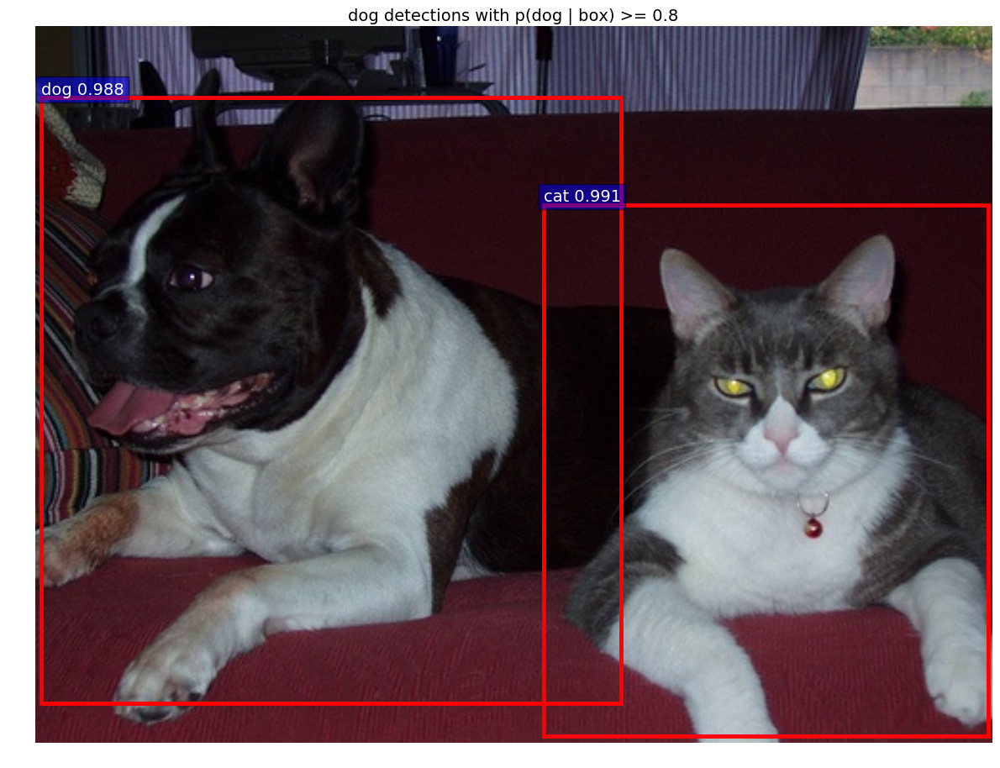

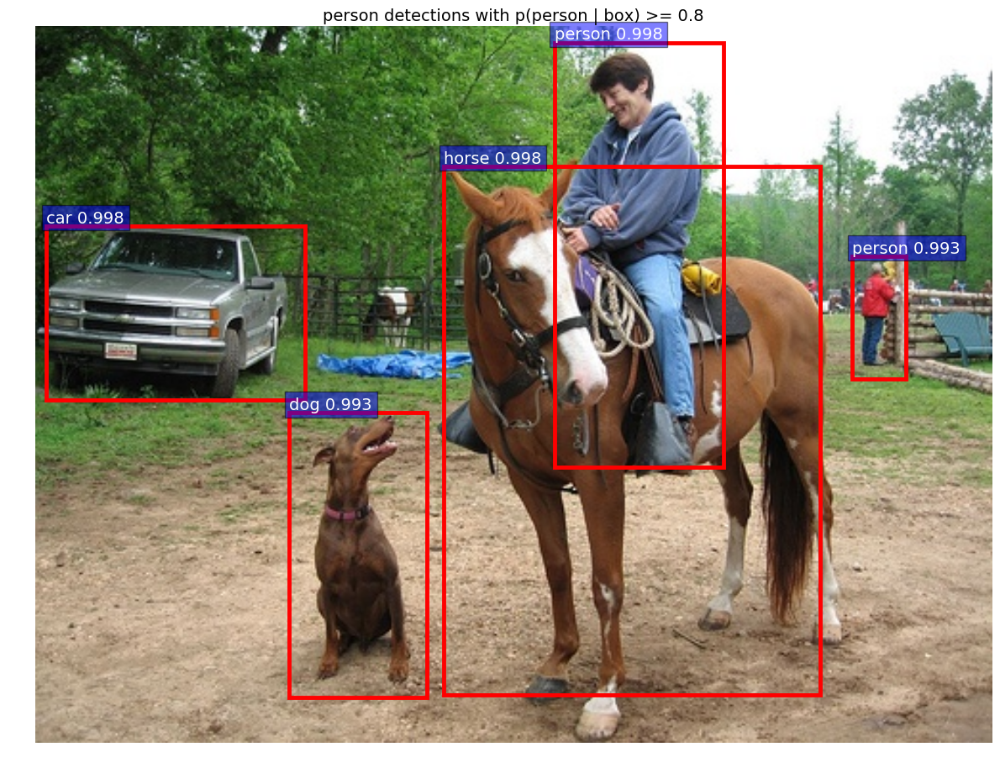

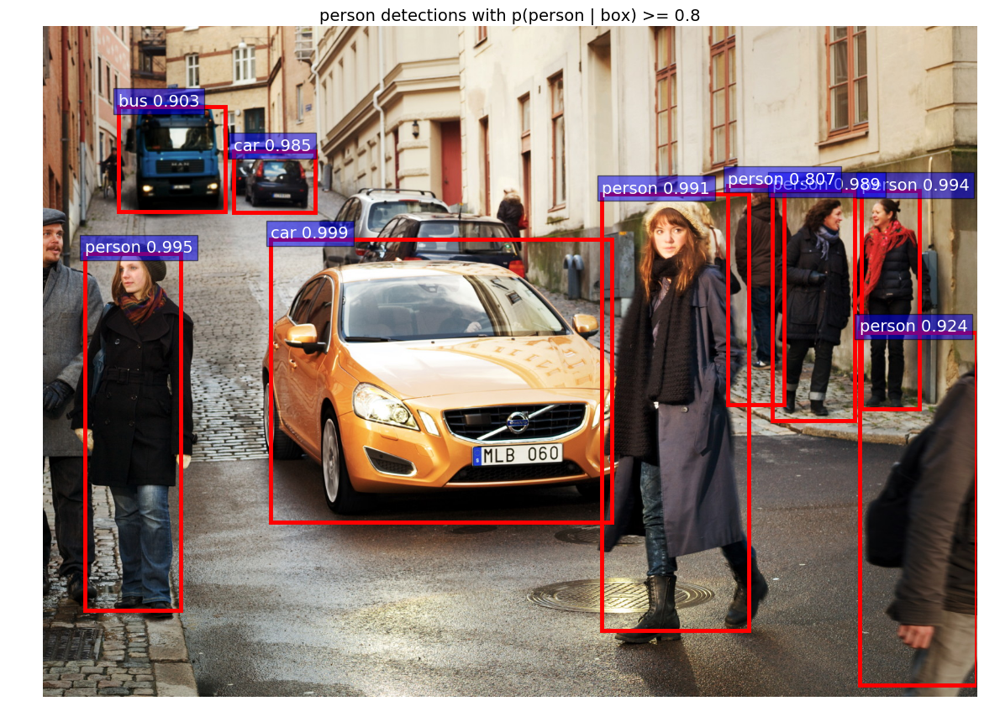

In [11]:
for i in xrange(2):
    _, _= im_detect(sess, net, im)

im_names = ['000456.jpg', '000542.jpg', '001150.jpg', '001763.jpg', '004545.jpg', 'pedestrian_cars.jpg']

for im_name in im_names:
    print('~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~')
    print('Demo for data/demo/{}'.format(im_name))
    demo(sess, net, im_name)

plt.show()